In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from torchvision.transforms import v2, transforms
import torchvision.models as models
from torchvision.utils import save_image
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
import torchvision.transforms as transforms
from PIL import Image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device
import matplotlib.pyplot as plt
import os

In [2]:
IMG_SIZE = 720
image_transforms = transforms.Compose([
        v2.Resize(size = (IMG_SIZE,IMG_SIZE)),
        v2.CenterCrop((IMG_SIZE,IMG_SIZE)),
        transforms.ToTensor(),
    ])

In [3]:
def load_image(img_path: str, 
               image_transforms: transforms.Compose) -> torch.Tensor:
    """
    Loads an image from the specified file path, applies the given transformations,
    and returns it as a tensor suitable for input to a PyTorch model.

    Args:
        img_path (str): The file path to the image to be loaded.
        image_transforms (transforms.Compose): A composition of transformations to be applied to the image.

    Returns:
        torch.Tensor: The transformed image as a tensor, with an added batch dimension, and moved to the specified device.

    Example:
        image_transforms = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        image_tensor = load_image('path/to/image.jpg', image_transforms)
    """
    image = Image.open(img_path)
    return image_transforms(image).unsqueeze(0).to(device)

In [4]:
def image_to_tensor(img_path: str, image_transforms: transforms.Compose) -> torch.Tensor:
    """
    Converts an image file to a PyTorch tensor after applying the specified transformations.

    Args:
        img_path (str): The file path to the image to be converted.
        image_transforms (transforms.Compose): A composition of image transformations to be applied.
            This should be a torchvision.transforms.Compose object containing various transformations
            such as resizing, cropping, normalization, etc.

    Returns:
        torch.Tensor: The transformed image as a PyTorch tensor.

    Example:
        from torchvision import transforms

        # Define the image transformations
        transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        # Convert image to tensor
        tensor = image_to_tensor('path/to/image.jpg', transform)
    """
    image = Image.open(img_path)
    return image_transforms(image)

In [5]:
import torch
import torch.nn as nn
import torchvision.models as models

class ImageStyler(nn.Module):
    def __init__(self):
        super(ImageStyler ,self,).__init__()
        self.chosen_features = ["0", "5", "10", "19", "28"]
        self.model = models.vgg19(pretrained = True ).features[:29]

    def forward(self,x):
        features = []
        for layer_num, layer in enumerate(self.model):
            x = layer(x)

            if str(layer_num) in self.chosen_features:
                features.append(x)

        return features


class ContentLoss(nn.Module):
    def __init__(self,):
        super(ContentLoss, self).__init__()
    
    def forward(self, input , target):
        loss = nn.functional.mse_loss(input, target)
        return loss


class StyleLoss(nn.Module):
    def __init__(self,):
        super(StyleLoss, self).__init__()

    def forward(self, input ,target_feature):
        G = self._gram_matrix(input)
        A = self._gram_matrix(target_feature).detach()
        loss = nn.functional.mse_loss(G, A)
        return loss
    
    def _gram_matrix(self,input):
        batch_size, num_feature_maps, height, width = input.size()
        features = input.view(batch_size * num_feature_maps, height * width)
        G = torch.mm(features, features.t())
        return G

model = ImageStyler().to(device).eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 163MB/s]  


In [6]:
original_img_path = '/kaggle/input/stylingimages/person3.jpg'
style_img_Path = '/kaggle/input/stylingimages/style8.jpg'

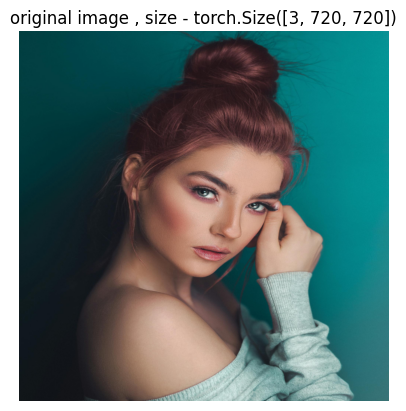

In [7]:
plt.imshow(image_to_tensor(original_img_path, image_transforms).permute(1,2,0))
plt.title(f'original image , size - {image_to_tensor(original_img_path, image_transforms).shape}')
plt.axis(False)
plt.show()

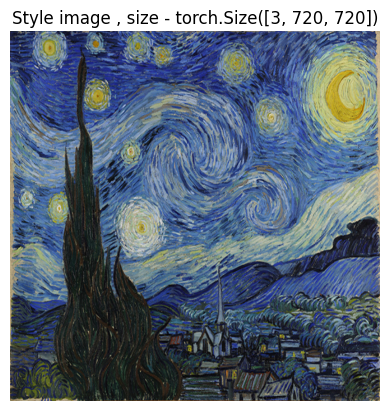

In [8]:
plt.imshow(image_to_tensor(style_img_Path , image_transforms).permute(1,2,0))
plt.title(f'Style image , size - {image_to_tensor(style_img_Path , image_transforms).shape}')
plt.axis(False)
plt.show()

In [9]:
original_img = load_image(img_path=original_img_path , image_transforms=image_transforms)
style_img = load_image(img_path=style_img_Path , image_transforms=image_transforms)
generated_img = original_img.clone().requires_grad_(True)

In [10]:
original_img.shape , style_img.shape , generated_img.shape

(torch.Size([1, 3, 720, 720]),
 torch.Size([1, 3, 720, 720]),
 torch.Size([1, 3, 720, 720]))

In [11]:
def save_generated_image(index: int,
                         generated_img: torch.Tensor) -> None:
    """
    Saves a generated image tensor to a specified directory with an indexed filename and optionally displays it.

    Args:
        index (int): The index number to be included in the generated image filename.
        generated_img (torch.Tensor): The generated image tensor to be saved.
        show (bool, optional): If True, displays the saved image using matplotlib. Defaults to True.

    Returns:
        None
    """
    sample_dir = 'Generated Images'
    os.makedirs(sample_dir, exist_ok=True)
    gen_img_name = 'generated-image-{0:0=8d}.png'.format(index)
    save_image(generated_img, os.path.join(sample_dir, gen_img_name))
    plt.imshow(generated_img.detach().cpu().squeeze(0).permute(1, 2, 0))
    plt.title(f'{gen_img_name}')
    plt.axis(False)
    plt.show()

In [12]:
def train_model(model : torch.nn.Module,
                generated_img : torch.Tensor,
                original_img : torch.Tensor,
                style_img : torch.Tensor,
                optimizer : torch.optim.Optimizer,
                content_loss_fn : torch.nn.Module,
                style_loss_fn : torch.nn.Module,
                content_weight : float,
                style_weight : float,
                save_generated_image: callable,
                epochs : int) -> dict[str, list[float]]:
    
    """
    Trains a neural network model for style transfer, optimizing the generated image to match the style of a given style image while preserving the content of an original image.

    Parameters:
    model (torch.nn.Module): The neural network model used to extract features from images.
    generated_img (torch.Tensor): The image being generated and optimized.
    original_img (torch.Tensor): The original image whose content is to be preserved.
    style_img (torch.Tensor): The style image whose style is to be applied to the generated image.
    optimizer (torch.optim.Optimizer): The optimizer used to update the generated image.
    content_loss_fn (callable): The function used to compute the content loss between the generated image and the original image.
    weights (tuple[float, float]): A tuple containing two weights: the content weight and the style weight.
    style_loss_fn (callable): The function used to compute the style loss between the generated image and the style image.
    epochs (int): The number of epochs for training.

    Returns:
    dict[str, list[float]]: A dictionary containing lists of content loss, style loss, and total loss recorded at each epoch.
    """

    results = {
        'content_loss' : [],
        'style_loss': [],
        'total_loss' : [],
    }

    for epoch in tqdm(range(epochs)):

        generated_img_features = model(generated_img)
        original_img_features = model(original_img)
        style_img_features = model(style_img)

        content_loss = 0
        style_loss = 0
        total_loss = 0

        for gen_feature, orig_feature, style_feature in zip(generated_img_features,
                                                            original_img_features,
                                                            style_img_features):

            content_loss += content_loss_fn(gen_feature , orig_feature)
            style_loss += style_loss_fn(gen_feature , style_feature)

        total_loss += content_weight * content_loss + style_weight * style_loss

        results['content_loss'].append(content_loss.item())
        results['style_loss'].append(style_loss.item())
        results['total_loss'].append(total_loss.item())

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if epoch % 200 == 0:
            results['content_loss'].append(content_loss.item())
            results['style_loss'].append(style_loss.item())
            results['total_loss'].append(total_loss.item())

            print('------------------ EPOCH {} -------------------'.format(epoch))
            print('Content Loss: {:.6f}, Style Loss: {:.6f}'.format(content_loss, style_loss))
            print('Total Loss: {:.6f}'.format(total_loss))
            print()

            save_generated_image(epoch+1, generated_img)
            save_image(generated_img , 'generated.png')

    return results

In [14]:
EPOCHS = 6000
LEARNING_RATE = 0.001
WEIGHTS = (20,0.1)
optimizer = optim.Adam([generated_img], lr=LEARNING_RATE)
content_loss_fn = ContentLoss()
style_loss_fn = StyleLoss()

  0%|          | 0/6000 [00:00<?, ?it/s]

------------------ EPOCH 0 -------------------
Content Loss: 0.000000, Style Loss: 1081443840.000000
Total Loss: 108144384.000000



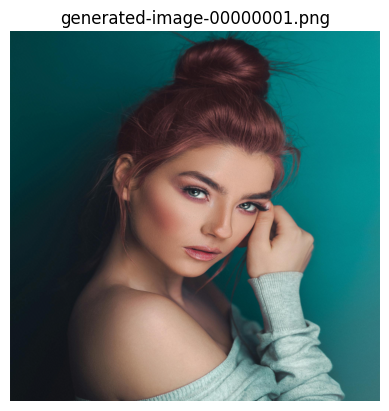

------------------ EPOCH 200 -------------------
Content Loss: 8.664320, Style Loss: 27259988.000000
Total Loss: 2726172.000000



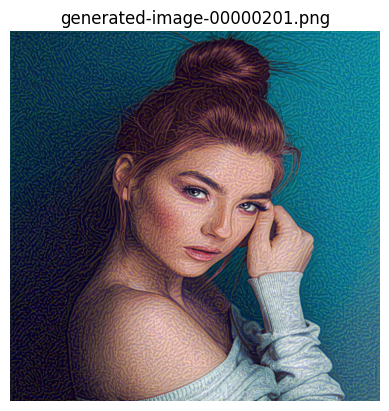

------------------ EPOCH 400 -------------------
Content Loss: 9.451284, Style Loss: 10867190.000000
Total Loss: 1086908.000000



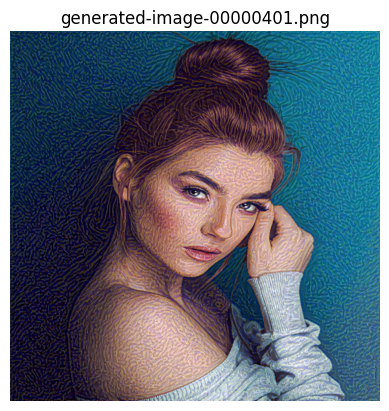

------------------ EPOCH 600 -------------------
Content Loss: 9.942354, Style Loss: 6420550.000000
Total Loss: 642253.875000



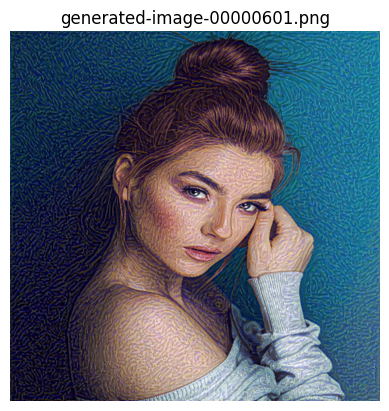

------------------ EPOCH 800 -------------------
Content Loss: 10.257132, Style Loss: 4219628.500000
Total Loss: 422168.000000



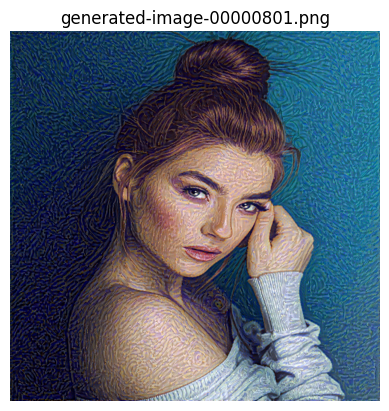

------------------ EPOCH 1000 -------------------
Content Loss: 10.473763, Style Loss: 2921273.250000
Total Loss: 292336.812500



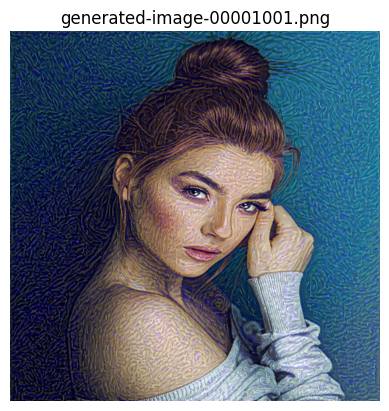

------------------ EPOCH 1200 -------------------
Content Loss: 10.638584, Style Loss: 2086271.750000
Total Loss: 208839.937500



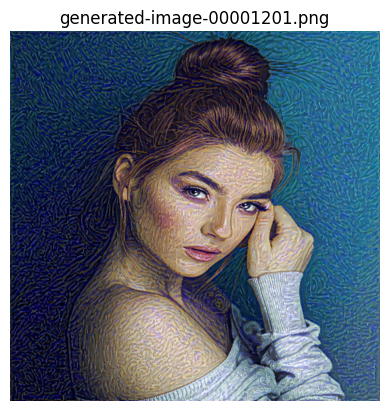

------------------ EPOCH 1400 -------------------
Content Loss: 10.772131, Style Loss: 1525821.500000
Total Loss: 152797.593750



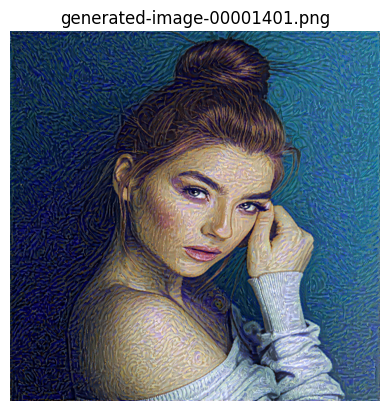

------------------ EPOCH 1600 -------------------
Content Loss: 10.883560, Style Loss: 1140685.375000
Total Loss: 114286.210938



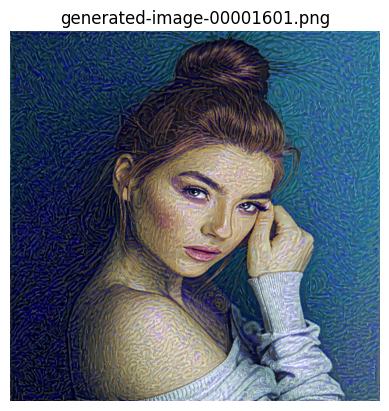

------------------ EPOCH 1800 -------------------
Content Loss: 10.977716, Style Loss: 873275.375000
Total Loss: 87547.093750



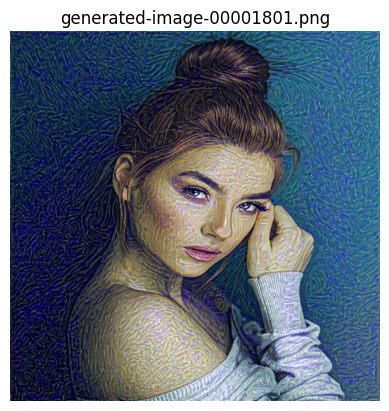

------------------ EPOCH 2000 -------------------
Content Loss: 11.058705, Style Loss: 685493.500000
Total Loss: 68770.523438



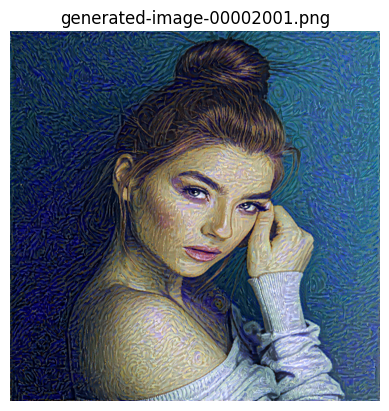

------------------ EPOCH 2200 -------------------
Content Loss: 11.130367, Style Loss: 551633.875000
Total Loss: 55385.992188



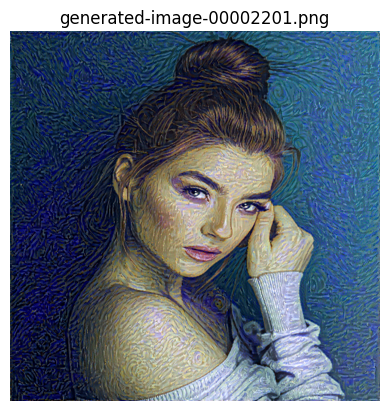

------------------ EPOCH 2400 -------------------
Content Loss: 11.195030, Style Loss: 454603.593750
Total Loss: 45684.261719



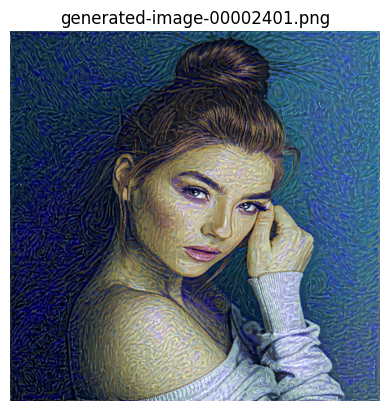

------------------ EPOCH 2600 -------------------
Content Loss: 11.251543, Style Loss: 382595.375000
Total Loss: 38484.570312



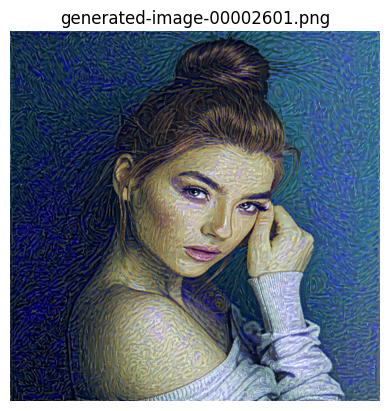

------------------ EPOCH 2800 -------------------
Content Loss: 11.304987, Style Loss: 327835.625000
Total Loss: 33009.664062



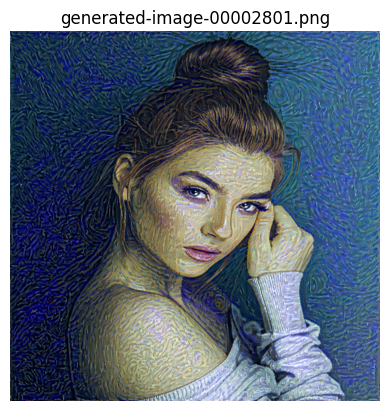

------------------ EPOCH 3000 -------------------
Content Loss: 11.352861, Style Loss: 285334.562500
Total Loss: 28760.513672



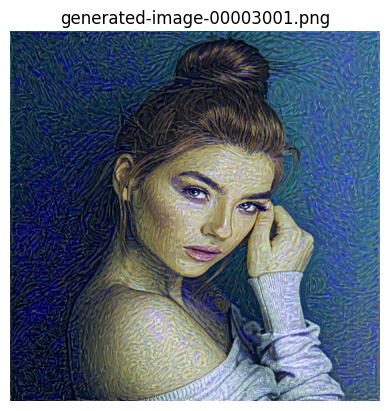

------------------ EPOCH 3200 -------------------
Content Loss: 11.397619, Style Loss: 251555.000000
Total Loss: 25383.453125



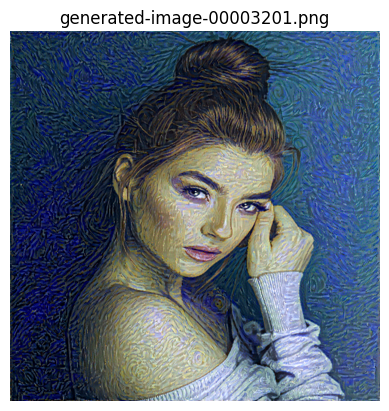

------------------ EPOCH 3400 -------------------
Content Loss: 11.440860, Style Loss: 224131.703125
Total Loss: 22641.986328



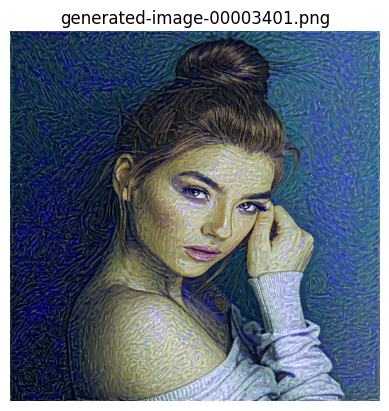

------------------ EPOCH 3600 -------------------
Content Loss: 11.481794, Style Loss: 201416.531250
Total Loss: 20371.291016



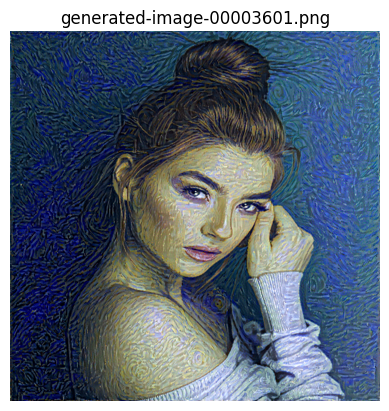

------------------ EPOCH 3800 -------------------
Content Loss: 11.519713, Style Loss: 182323.671875
Total Loss: 18462.761719



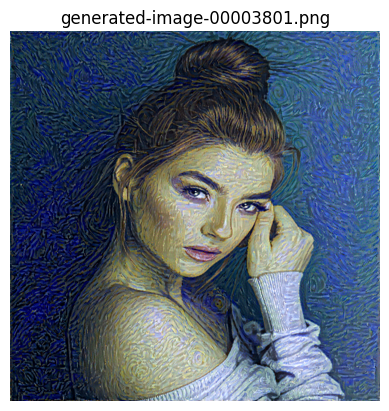

------------------ EPOCH 4000 -------------------
Content Loss: 11.556295, Style Loss: 165977.937500
Total Loss: 16828.919922



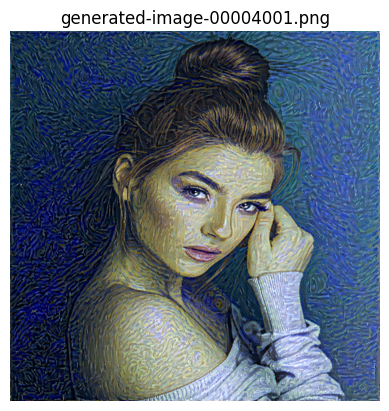

------------------ EPOCH 4200 -------------------
Content Loss: 11.591298, Style Loss: 151840.140625
Total Loss: 15415.840820



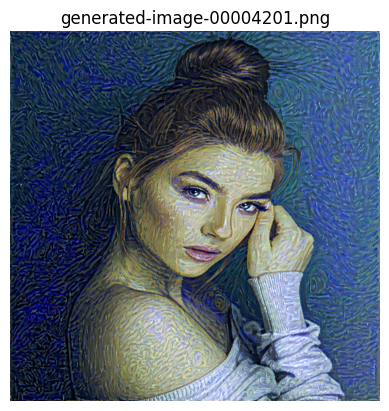

------------------ EPOCH 4400 -------------------
Content Loss: 11.623602, Style Loss: 139486.531250
Total Loss: 14181.125000



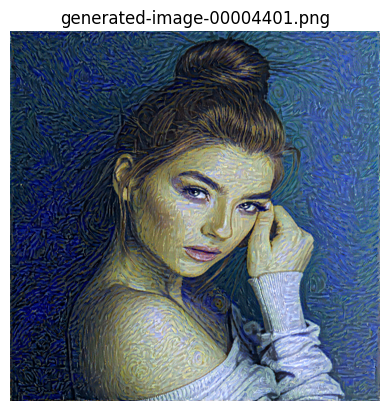

------------------ EPOCH 4600 -------------------
Content Loss: 11.653903, Style Loss: 128586.296875
Total Loss: 13091.708008



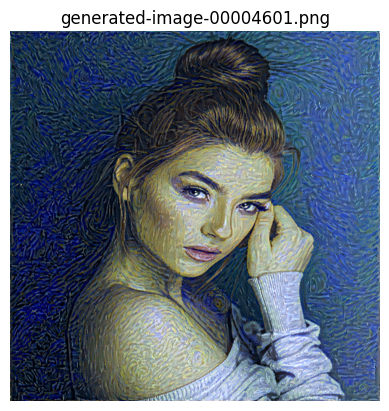

------------------ EPOCH 4800 -------------------
Content Loss: 11.682993, Style Loss: 118921.046875
Total Loss: 12125.764648



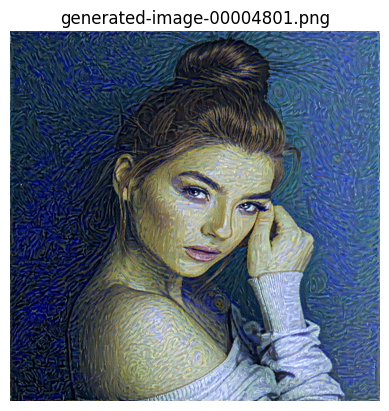

------------------ EPOCH 5000 -------------------
Content Loss: 11.710783, Style Loss: 110287.843750
Total Loss: 11263.000000



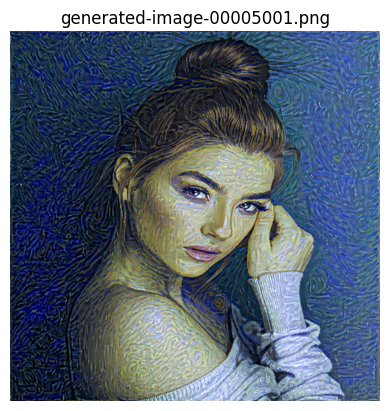

------------------ EPOCH 5200 -------------------
Content Loss: 11.736805, Style Loss: 102520.281250
Total Loss: 10486.764648



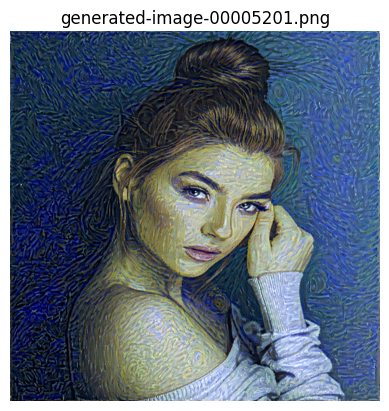

------------------ EPOCH 5400 -------------------
Content Loss: 11.766216, Style Loss: 95566.445312
Total Loss: 9791.968750



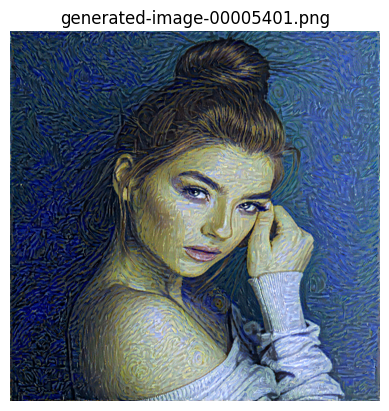

------------------ EPOCH 5600 -------------------
Content Loss: 11.781332, Style Loss: 89237.359375
Total Loss: 9159.363281



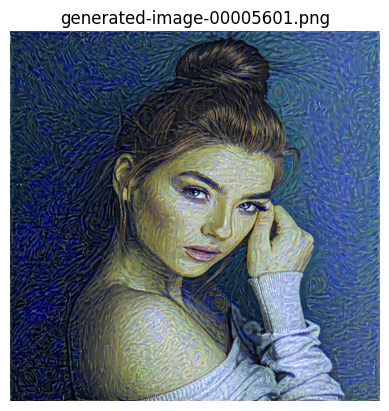

------------------ EPOCH 5800 -------------------
Content Loss: 11.815073, Style Loss: 83693.781250
Total Loss: 8605.679688



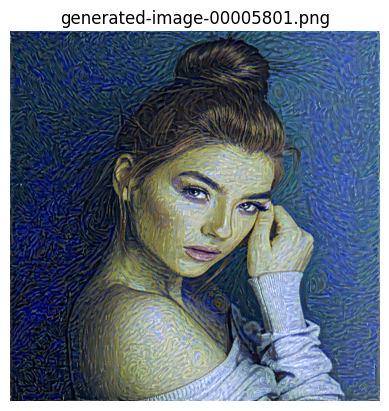

In [15]:
model_history = train_model(model = model ,
                            generated_img = generated_img ,
                            original_img = original_img ,
                            style_img = style_img,
                            optimizer = optimizer ,
                            content_loss_fn = content_loss_fn ,
                            style_loss_fn = style_loss_fn ,
                            content_weight = WEIGHTS[0],
                            style_weight = WEIGHTS[1],
                            save_generated_image = save_generated_image,
                            epochs = EPOCHS)

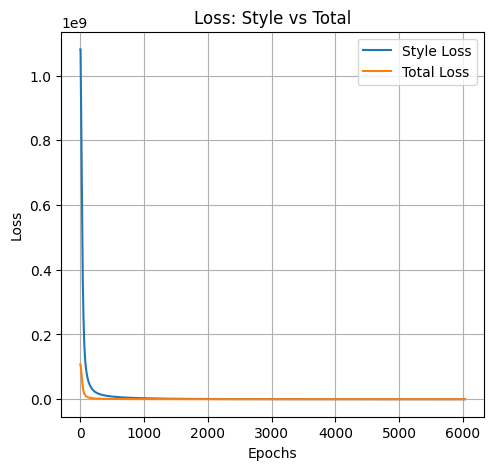

In [16]:
def plot_loss_curves(results: dict[str, list[float]]) -> None:
    """
    Plots the style loss and total loss curves over epochs based on the provided results dictionary.

    Args:
        results (dict[str, list[float]]): A dictionary containing the loss values.
            Expected keys are 'style_loss' and 'total_loss', with corresponding lists of loss values for each epoch.

    Returns:
        None

    Example:
        results = {
            'style_loss': [0.8, 0.6, 0.4, 0.2],
            'total_loss': [1.0, 0.7, 0.5, 0.3]
        }
        plot_loss_curves(results)
    """
    style_loss = results['style_loss']
    total_loss = results['total_loss']

    epochs = range(len(style_loss))

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, style_loss, label='Style Loss')
    plt.plot(epochs, total_loss, label='Total Loss')
    plt.title('Loss: Style vs Total')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
plot_loss_curves(model_history)

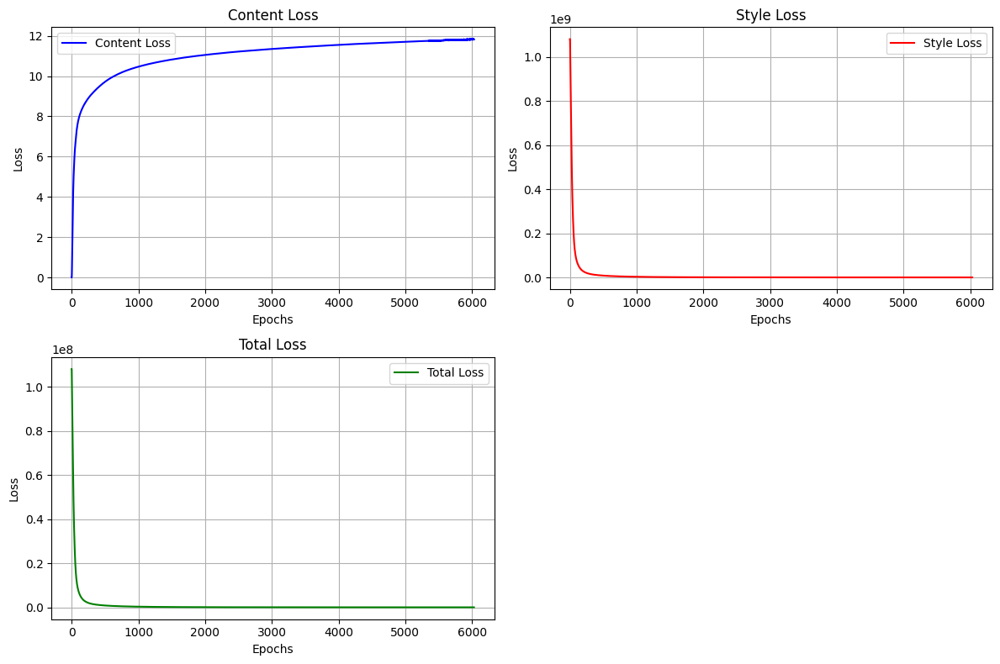

In [19]:
from matplotlib.gridspec import GridSpec
def plot_loss_curve_grid(results: dict[str, list[float]]) -> None:
    """
    Plots the content loss, style loss, and total loss curves over epochs using a grid layout.

    Args:
        results (dict[str, list[float]]): A dictionary containing the loss values.
            Expected keys are 'content_loss', 'style_loss', and 'total_loss', with corresponding lists of loss values for each epoch.

    Returns:
        None

    Example:
        results = {
            'content_loss': [1.0, 0.8, 0.6, 0.4],
            'style_loss': [0.9, 0.7, 0.5, 0.3],
            'total_loss': [1.9, 1.5, 1.1, 0.7]
        }
        plot_loss_curve_grid(results)
    """
    content_loss = results['content_loss']
    style_loss = results['style_loss']
    total_loss = results['total_loss']

    epochs = range(len(content_loss))

    fig = plt.figure(figsize=(12, 8))
    gs = GridSpec(2, 2, figure=fig)

    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, content_loss, color='b', label='Content Loss')
    ax1.set_title('Content Loss')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(epochs, style_loss, color='r', label='Style Loss')
    ax2.set_title('Style Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    ax3 = fig.add_subplot(gs[1, 0])
    ax3.plot(epochs, total_loss, color='g', label='Total Loss')
    ax3.set_title('Total Loss')
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Loss')
    ax3.legend()
    ax3.grid(True)

    plt.tight_layout()
    plt.show()
plot_loss_curve_grid(model_history)

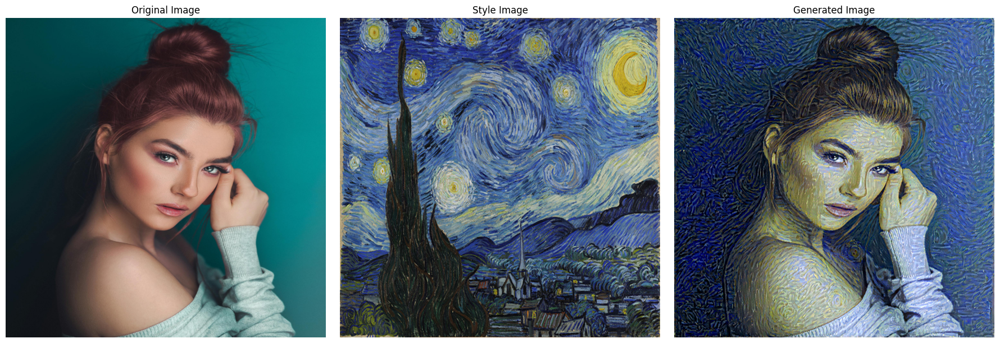

In [28]:
def plot_images_grid(original_img_path: str,
                     generated_img_path: str,
                     style_img_path: str,
                     image_to_tensor : callable , 
                     image_transforms: transforms.Compose) -> None:
    """
    Plots the original, generated, and style images in a 1x3 grid structure.

    Args:
        original_img_path (str): The file path to the original image.
        generated_img_path (str): The file path to the generated image.
        style_img_path (str): The file path to the style image.
        image_transforms (transforms.Compose): A composition of image transformations to be applied.

    Returns:
        None
    """
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    original_img_tensor = image_to_tensor(original_img_path, image_transforms)
    generated_img_tensor = image_to_tensor(generated_img_path, image_transforms)
    style_img_tensor = image_to_tensor(style_img_path, image_transforms)

    to_pil = ToPILImage()

    # Plot Original Image
    axs[0].imshow(to_pil(original_img_tensor))
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Plot Style Image
    axs[1].imshow(to_pil(style_img_tensor))
    axs[1].set_title('Style Image')
    axs[1].axis('off')
    
        # Plot Generated Image
    axs[2].imshow(to_pil(generated_img_tensor))
    axs[2].set_title('Generated Image')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()
    
generated_img_path = '/kaggle/working/generated.png'

plot_images_grid(original_img_path, 
                 generated_img_path,
                 style_img_Path, 
                 image_to_tensor,
                 image_transforms)